## 1. DATA EXPLORATION

Objective :
This case requires developing a customer segmentation to give recommendations like saving plans, loans, wealth management, etc. on target customer groups.

In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [49]:
df  = pd.read_csv('CustomerData.csv')
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


#### Attributes 
จากข้อมูลภายใน Dataset พบว่า มี Attributes ทั้งหมด 28 attributes ได้แก่
1. CUST_ID
2. BALANCE : เงินคงเหลือของ credit card เฉลี่ยต่อเดือน
3. BALANCE_FREQUENCY : อัตราส่วนของ 12 เดือนล่าสุดกับเงินคงเหลือ
4. PURCHASES : จำนวนเงินทั้งหมดที่ใช้
5. ONEOFF_PURCHASES : เงินที่ใช้ credit card จ่ายทีเดียว
6. INSTALLMENTS_PURCHASES : เงินที่ใช้ credit card จ่ายแบบผ่อน
7. CASH_ADVANCE : เงินสดที่เบิกออกมาใช้ล่วงหน้าจาก credit card
8. PURCHASES_FREQUENCY 
9. ONEOFF_PURCHASES_FREQUENCY 
10. PURCHASES_INSTALLMENTS_FREQUENCY 
11. CASH_ADVANCE_FREQUENCY 
12. CASH_ADVANCE_TRX : จำนวนเงินเฉลี่ยที่ถอนจาก credit card 1 ครั้ง
13. PURCHASES_TRX : จำนวนเงินเฉลี่ยต่อการใช้ credit card 1 ครั้ง
14. CREDIT_LIMIT : วงเงินจำกัดของ credit card
15. PAYMENTS : จำนวนเงินที่ชำระ credit card 
16. MINIMUM_PAYMENTS : จำนวนเงินที่ชำระขั้นต่ำ
17. PRC_FULL_PAYMENT : เปอร์เซ็นต์ของเดือนกับจำนวนเงินชำระทั้งหมดของใบแจ้งยอด
18. TENURE : ช่วงเวลาระหว่างการเบิกจ่ายและการชำระเงิน

#### Find missing value
หลังจากนั้นจะทำการเช็คในเรื่องของ missing value (NaN) ที่อยู่ภายใน dataset เนื่องจาก missing value หรือการขาดหายไปของข้อมูลอาจส่งผลต่อการ predict ข้อมูลในภายหลัง โดยใช้ isnull().sum() เพื่อหาผลรวมของ missing value ในแต่ละ attributes
ซึ่งจากการหา missing value ของข้อมูลใน dataset พบว่า มีค่า missing value อยู่ใน CREDIT_LIMIT และ MINIMUM_PAYMENT ซึ่งจะมีการนำ missing value ออกในส่วนของ data preprocessing 

In [50]:
# find sum of missing value in each attributes 
#   - CREDIT_LIMIT = 1
#   - MINIMUM_PAYMENT = 313

df.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

#### Info
จากนั้นสำรวจลักษณะของ attributes ว่ามีข้อมูลใน type ใดบ้าง เพื่อให้เกิดความสะดวกในการสำรวจของข้อมูล โดยใช้ info() ซึ่งจากการแสดงลักษณะของข้อมูลพบว่า มีข้อมูลอยู่แค่รูปแบบเดียว นั่นคือ Numerical data (int64, float64)

In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

#### Describe 

In [52]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


-----------------------------------------------------------------------------------------------

#### Numerical data

เริ่มทำการสำรวจข้อมูลในส่วนของ numerical data ก่อน โดยจะเริ่มจากการหา correlation เพื่อดูความสัมพันธ์ระหว่าง attribute แต่ละตัว เพื่อพิจารณาการเลือก attribute โดยจะเลือก attribute ที่ไม่มี correlation ระหว่างกันที่สูง โดยจะ plot ออกมาเป็น Heatmap ที่มีการใช้ sns.heatmap()

<AxesSubplot:>

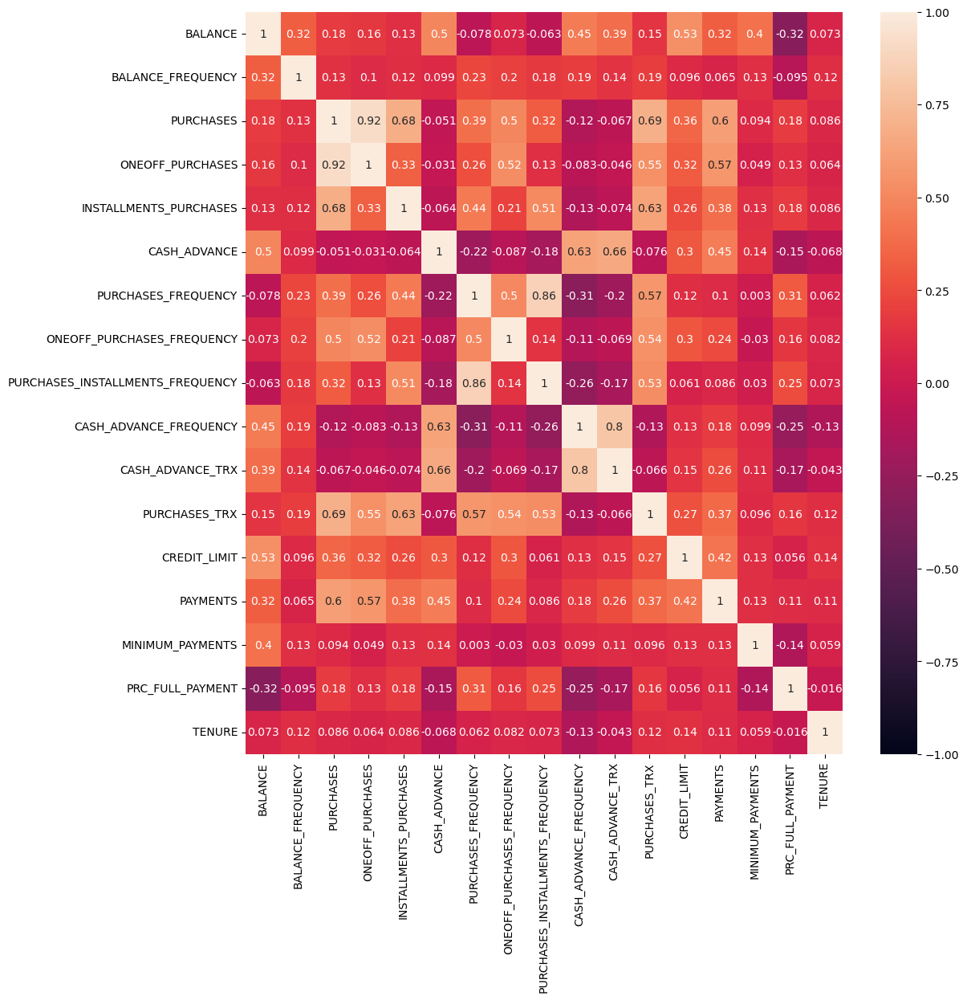

In [53]:
cor = df.corr()
plt.figure(figsize=(12, 12))
sns.heatmap(cor, vmin = -1, vmax = 1, annot = True)

จากการ plot heatmap พบว่า attribute ที่มีความสัมพันธ์ระหว่างกันที่ค่อนข้างมากอย่างเห็นได้ชัด 8 อันดับแรก ได้แก่
- 0.92 : purchase & one-off purchase
- 0.86 : purchase frequency & purchase installment frequency
- 0.80 : cash advance frequency & cash advance TRX
- 0.69 : purchase & purchase TRX
- 0.68 : purchase & installment purchase
- 0.66 : cash advance & cash advance TRX
- 0.63 : cash advance & cash advance frequency
- 0.61 : payment & purchase

ซึ่งสามารถสังเกตได้ว่า attributes ที่มีชื่อที่คล้ายกันจะมีความเกี่ยวข้องกันค่อนข้างมากในรูปของความหมายโดยรวม เช่น PURCHASES, ONEOFF_PURCHASES, INSTALLMENTS_PURCHASES ทั้งหมดมีความเกี่ยวข้องกับการใช้เงินแต่จะแตกต่างกันในเรื่องของรูปแบบของการใช้เงิน

-------------------------------------------------------------------------------------

จากนั้นจะทำการดูความสัมพันธ์ของ attributes ใน dataset โดยทำการ plot ออกมาเป็นกราฟ ในส่วนนี้จะใช้ sns.pairplot()

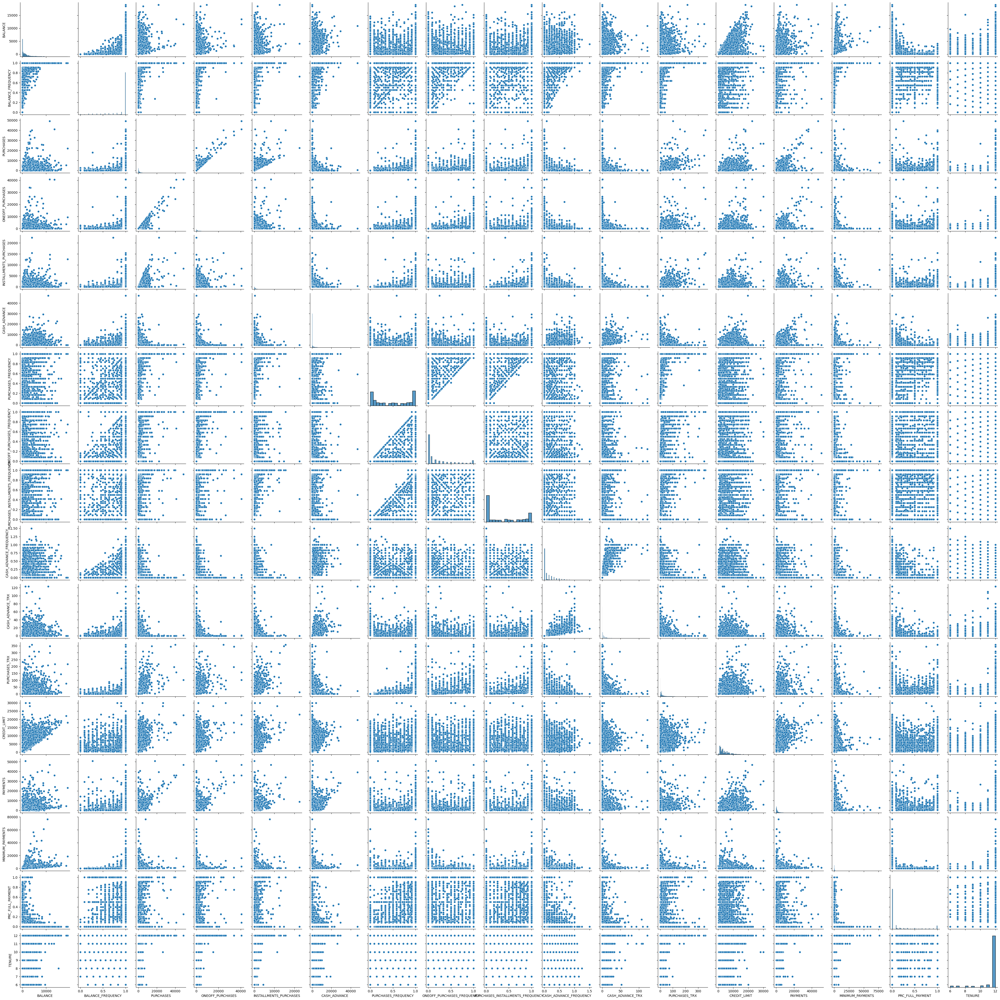

In [54]:
%matplotlib inline
sns.pairplot(df)

------------------------------------------------------------------------------------------------------------------------------------------------

จากนั้นทำการ plot กราฟเพื่อดูลักษณะการกระจายตัวของข้อมูล จึงได้มีการ plot distribution graph โดยใช้ sns.histplot()

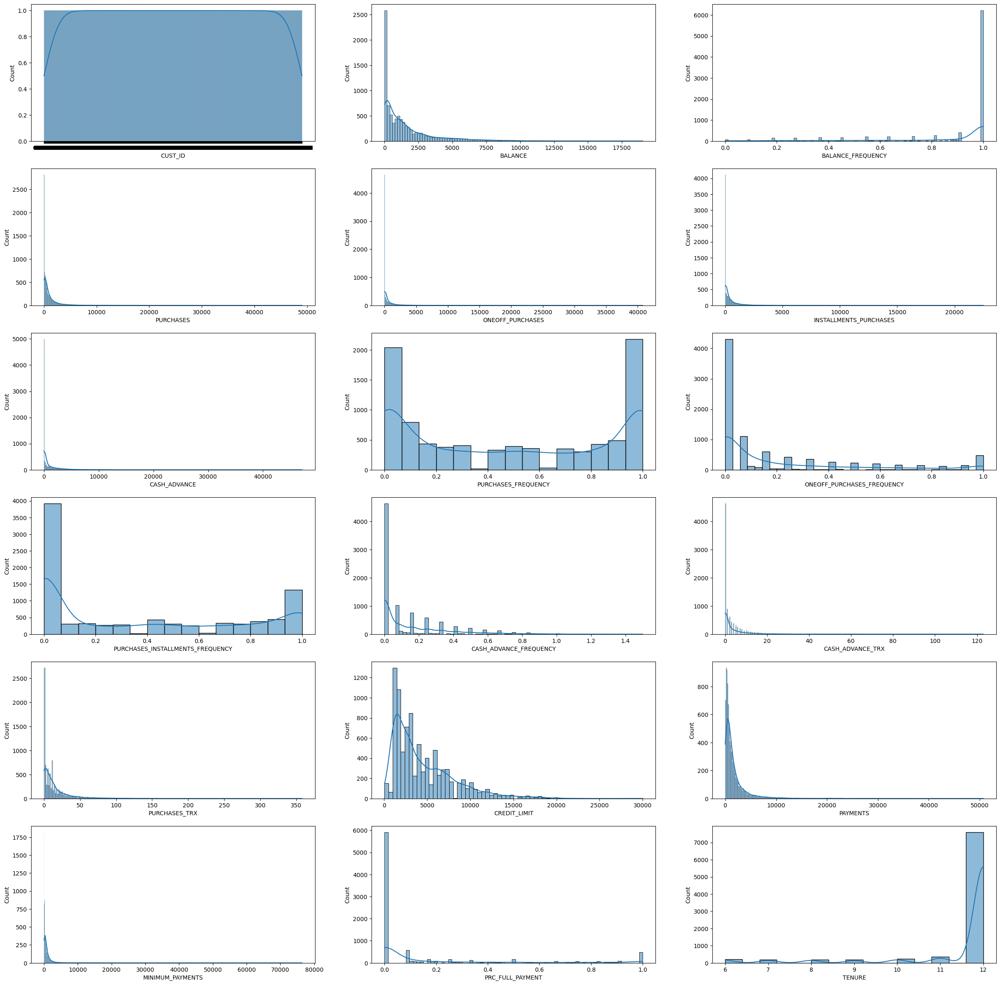

In [55]:
colsNu = df.columns
fig, ax = plt.subplots(6, 3, figsize=(30,30))

row = 0
for col in range(0, 18):
    if col % 3 == 0 and col != 0:
        row += 1
    sns.histplot(data = df, x = colsNu[col], kde=True, ax=ax[row][col%3])
    
plt.show()

จากการ plot distribution graph พบว่า ลักษณะการกระจายตัวของข้อมูลในแต่ละ attributes ค่อนข้างมีลักษณะที่คล้ายคลึงกัน โดยจะมีลักษณะเป็นกราฟเบ้ซ้าย นอกจากนี้ในแต่ละ attributes ยังมีค่าอยู่ที่ค่า 0 เป็นจำนวนมาก 

----------------------------------------------------------------------------------------------------------

จากนั้นทำการ plot กราฟ boxplot เพื่อดูลักษณะของข้อมูลของแต่ละ attribute โดยจะใช้ sns.boxplot

In [56]:
# delete customer ID (CUST_ID) >> it is individual data for each customer
df = df.drop(columns="CUST_ID")

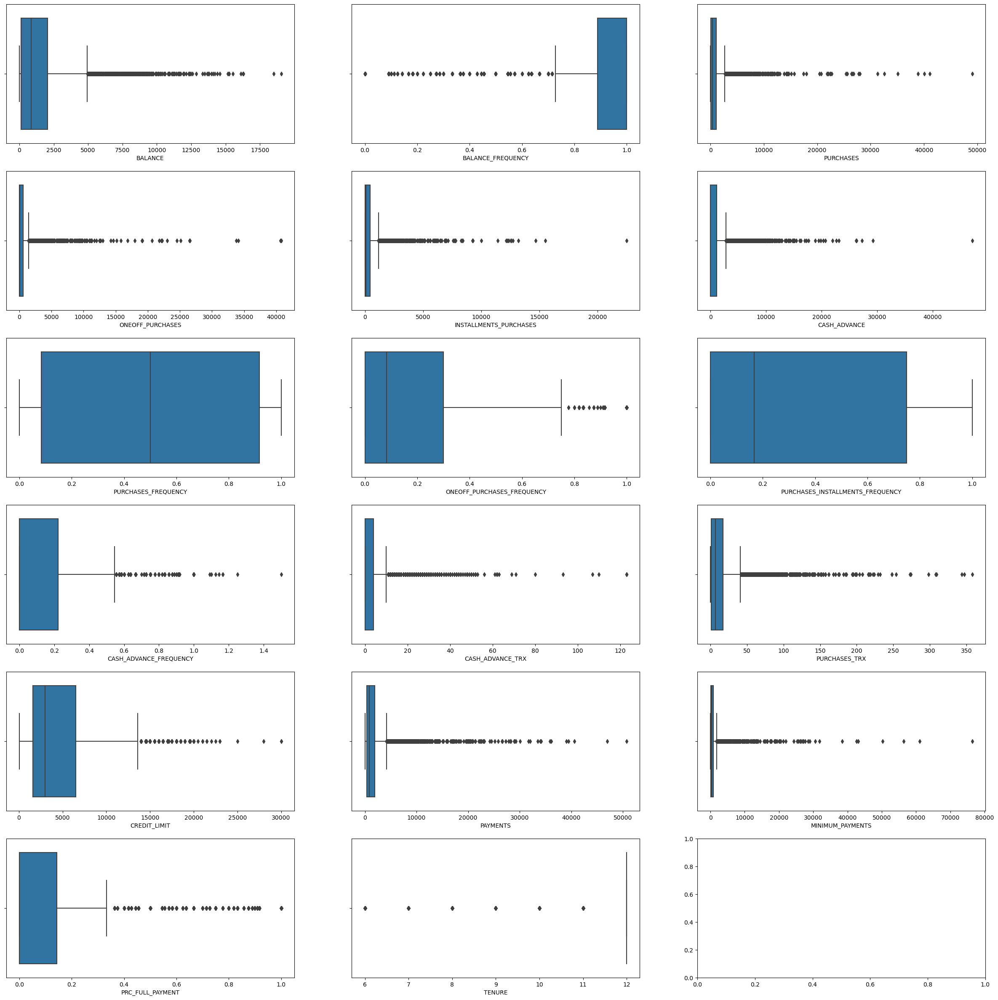

In [57]:
colsNu = df.columns
fig, ax = plt.subplots(6, 3, figsize=(30,30))

row = 0
for col in range(0, 17):
    if col % 3 == 0 and col != 0:
        row += 1
    sns.boxplot(data = df, x = colsNu[col], ax=ax[row][col%3])
    
plt.show()

จากการ plot กราฟ พบว่า ในแต่ละ attributes มี outlier ที่ค่อนข้างมาก จึงมองว่าในส่วนของ data preprocessing จะไม่มีการเลือกตัด outlier เนื่องจากการตัด outlier อาจส่งผลทำให้ข้อมูลที่สำคัญบางอย่างขาดหายไป อีกทั้งยังทำให้ปริมาณข้อมูลทั้งหมดที่อยู่ใน raw data เหลือน้อย

-------------------------------------------------------------------------------------------------------

หลังจากการสำรวจ data ข้างต้น ได้มีการเลือก attributes สำหรับนำไปสร้าง model โดย attributes ดังกล่าวจะเป็น attributes ที่เกี่ยวข้องกับรูปแบบการใช้เงินของแต่ละบุคคล เพื่อนำมาหา cluster ในการแบ่งรูปแบบการใช้จ่ายเงินว่าแต่ละบุคคลนั้นมีรูปแบบการใช้จ่ายเงินเป็นอย่างไร เพื่อจะเป็นส่วนสำคัญในการนำไปเลือกหารูปแบบสำหรับการ recommendation ที่มีความเหมาะสมกับแต่ละ cluster โดย attributes ที่เลือกมา ได้แก่ ONEOFF_PURCHASES_FREQUENCY, PURCHASES_INSTALLMENTS_FREQUENCY, CASH_ADVANCE_FREQUENCY, PAYMENTS, PURCHASES, BALANCE


In [58]:
df_choose = df[['PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'PAYMENTS', 'PURCHASES', 'BALANCE']]
df_choose

,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PAYMENTS,PURCHASES,BALANCE
0,0.166667,0.000000,0.083333,0.000000,201.802084,95.40,40.900749
1,0.000000,0.000000,0.000000,0.250000,4103.032597,0.00,3202.467416
2,1.000000,1.000000,0.000000,0.000000,622.066742,773.17,2495.148862
3,0.083333,0.083333,0.000000,0.083333,0.000000,1499.00,1666.670542
4,0.083333,0.083333,0.000000,0.000000,678.334763,16.00,817.714335
...,...,...,...,...,...,...,...
8945,1.000000,0.000000,0.833333,0.000000,325.594462,291.12,28.493517
8946,1.000000,0.000000,0.833333,0.000000,275.861322,300.00,19.183215
8947,0.833333,0.000000,0.666667,0.000000,81.270775,144.40,23.398673
8948,0.000000,0.000000,0.000000,0.166667,52.549959,0.00,13.457564


In [59]:
df_choose.describe()

,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PAYMENTS,PURCHASES,BALANCE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000
mean,0.490351,0.202458,0.364437,0.135144,1733.143852,1003.204834,1564.474828
std,0.401371,0.298336,0.397448,0.200121,2895.063757,2136.634782,2081.531879
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.083333,0.000000,0.000000,0.000000,383.276166,39.635000,128.281915
50%,0.500000,0.083333,0.166667,0.000000,856.901546,361.280000,873.385231
75%,0.916667,0.300000,0.750000,0.222222,1901.134317,1110.130000,2054.140036
max,1.000000,1.000000,1.000000,1.500000,50721.483360,49039.570000,19043.138560


หลังจากนั้นจะทำการดูความสัมพันธ์ของ attributes ที่ได้เลือกมา โดยทำการ plot ออกมาเป็นกราฟ ในส่วนนี้จะใช้ sns.pairplot()

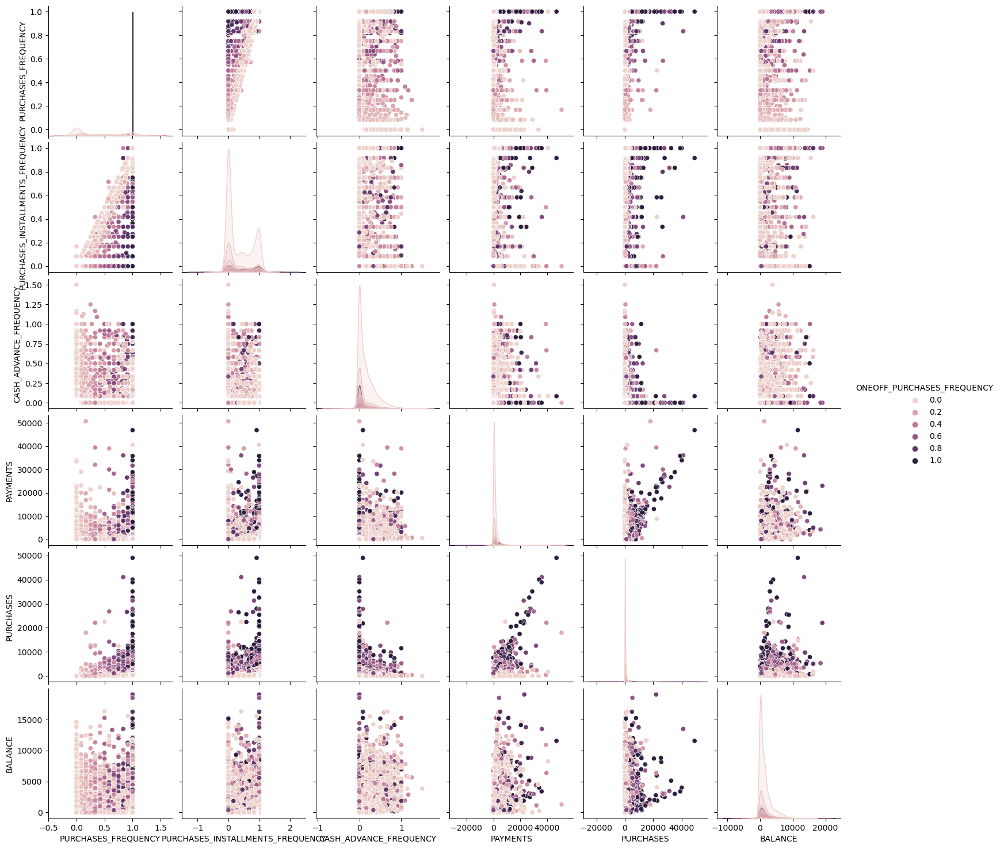

In [60]:
sns.pairplot(df_choose, hue = 'ONEOFF_PURCHASES_FREQUENCY')

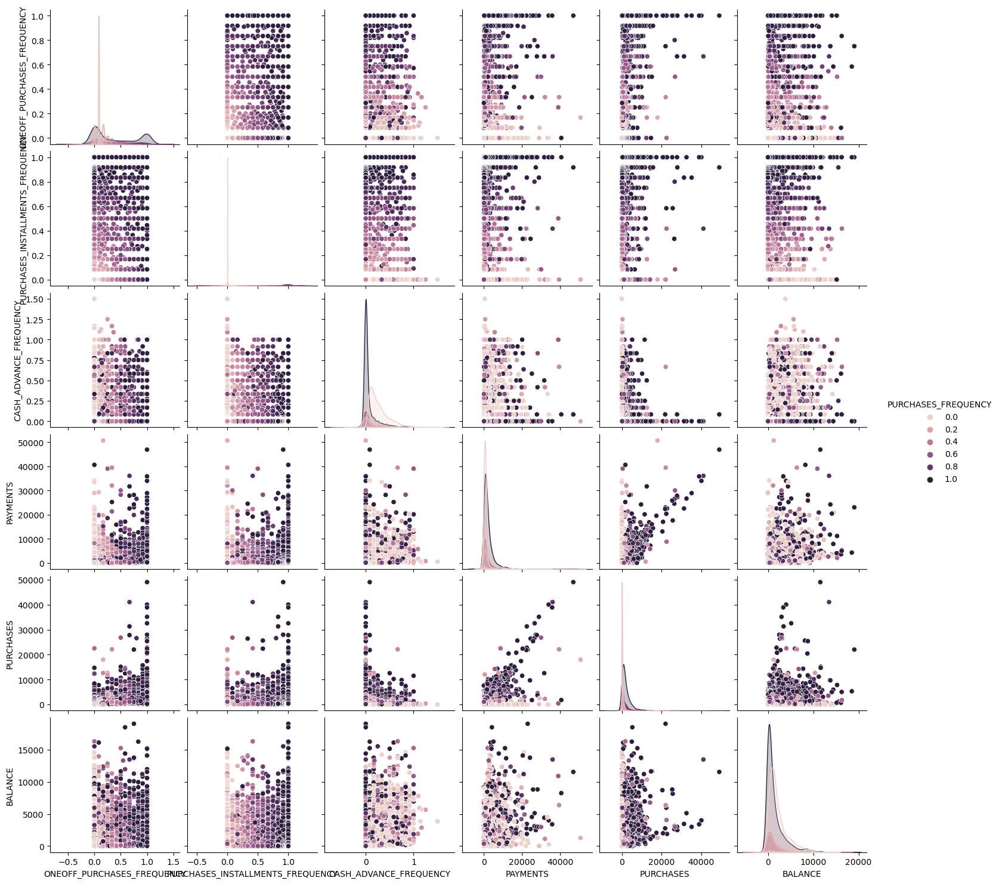

In [76]:
sns.pairplot(df_choose, hue = 'PURCHASES_FREQUENCY')

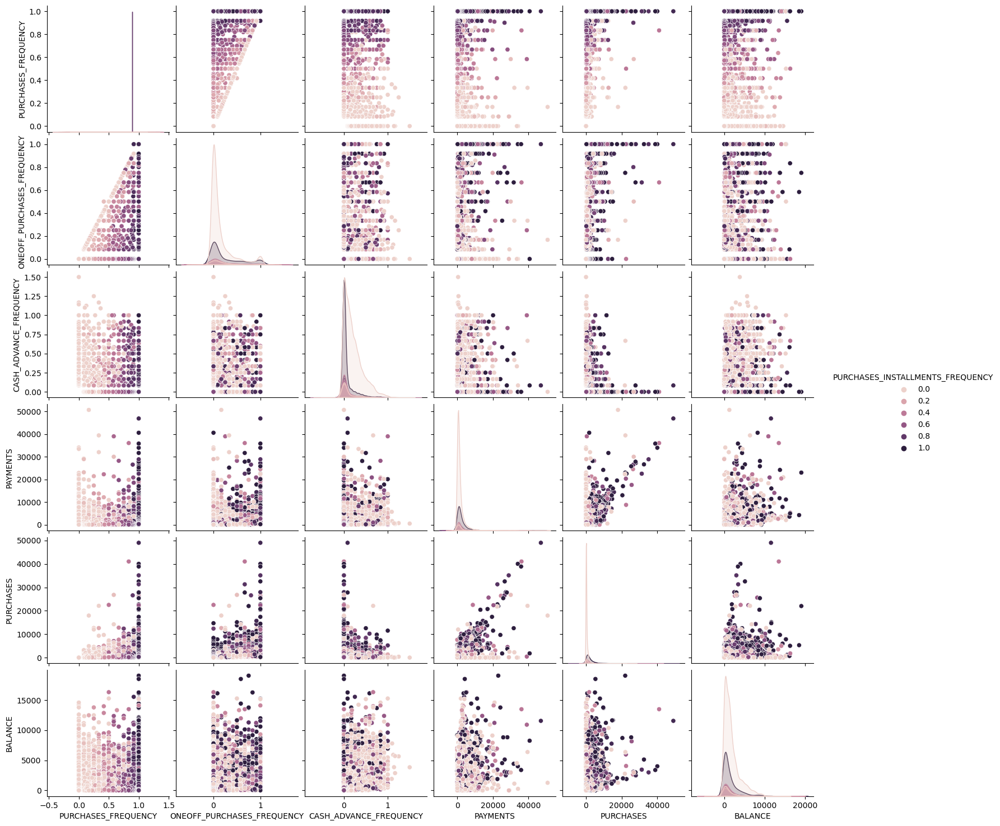

In [61]:
sns.pairplot(df_choose, hue = 'PURCHASES_INSTALLMENTS_FREQUENCY')

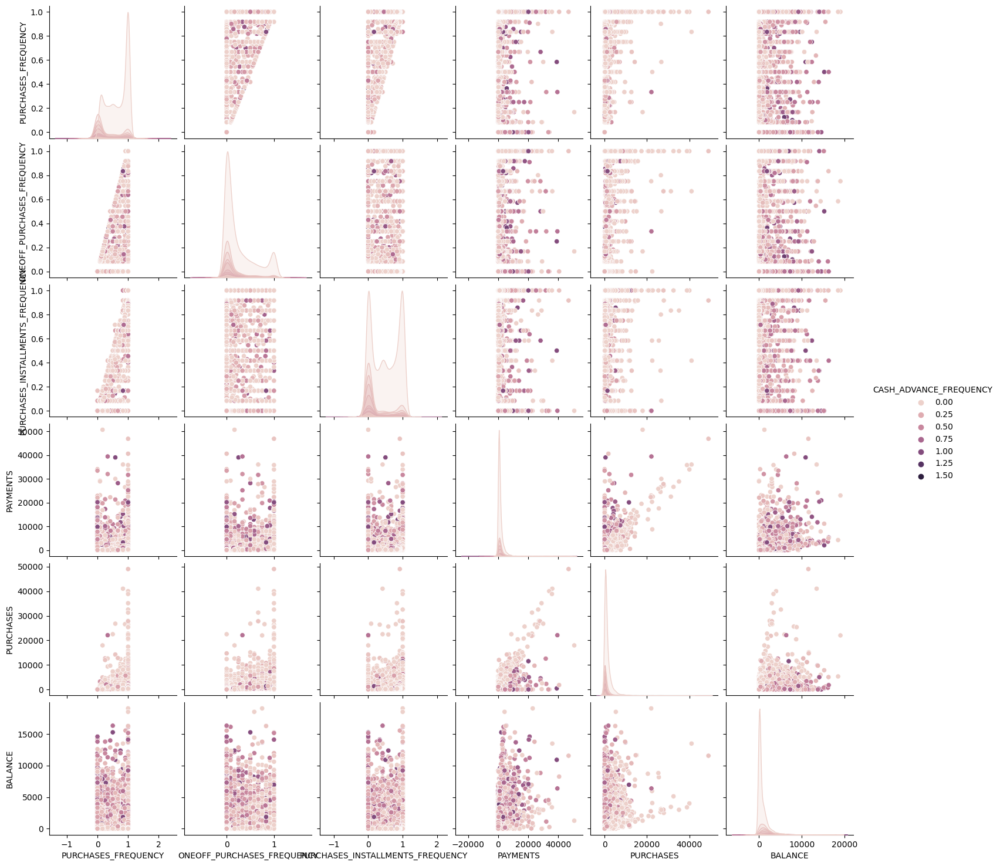

In [62]:
sns.pairplot(df_choose, hue = 'CASH_ADVANCE_FREQUENCY')

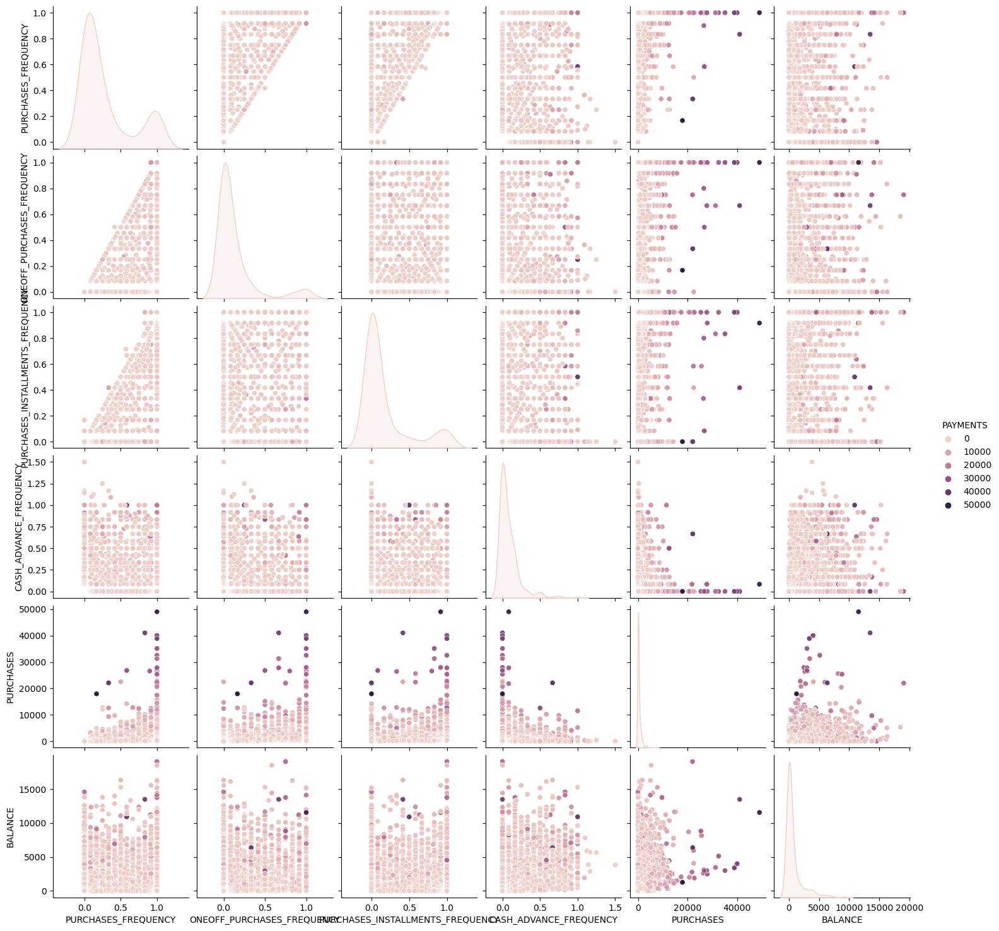

In [63]:
sns.pairplot(df_choose, hue = 'PAYMENTS')

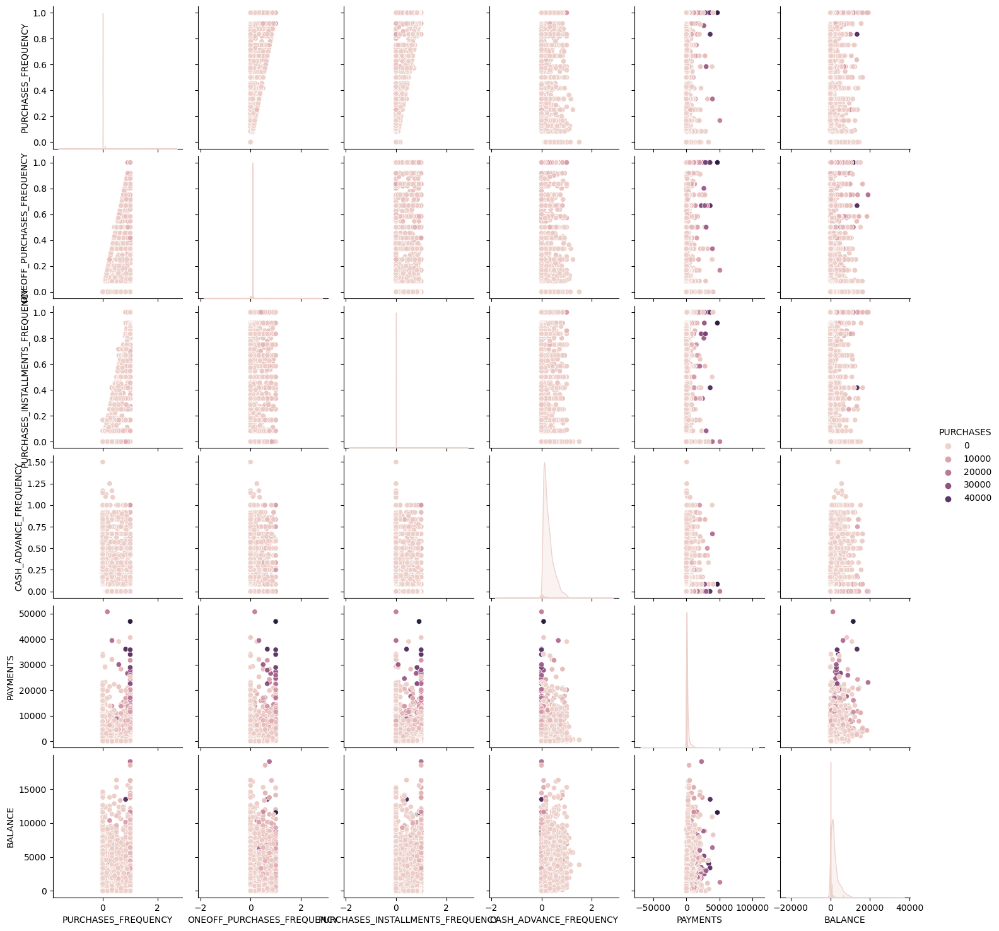

In [64]:
sns.pairplot(df_choose, hue = 'PURCHASES')

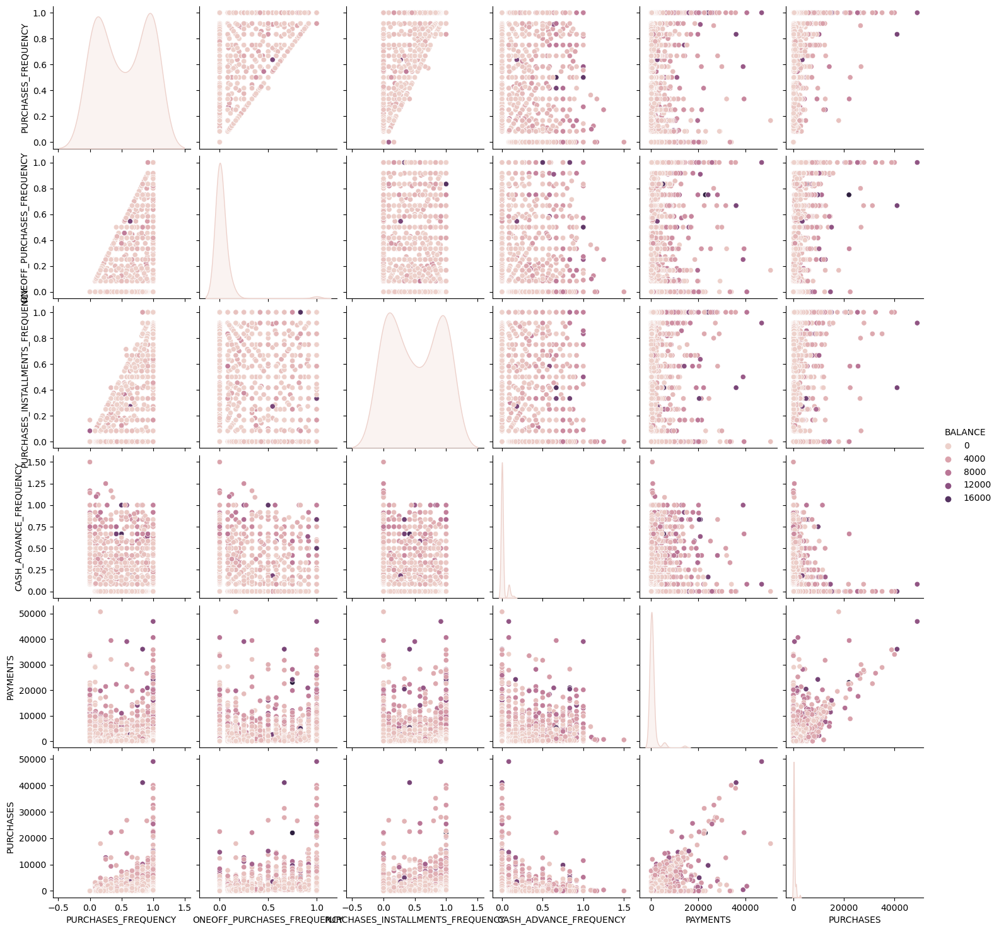

In [65]:
sns.pairplot(df_choose, hue = 'BALANCE')

จากการ plot กราฟ พบว่า
- คนที่มี PAYMENTS ที่สูง มักจะมี PURCHASES ที่สูง
- คนที่มี PAYMENTS ที่สูง มักจะมี BALANCE ที่สูง
- คนที่มี PURCHASES ที่ต่ำ มักจะมี CASH_ADVANCE_FREQUENCY สูงกว่าคนที่มี PURCHASES ที่สูง
- คนที่มี PURCHASES ที่ต่ำ มักจะมี ONEOFF_PURCHASES_FREQUENCY และ PURCHASES_INSTALLMENTS_FREQUENCY ที่ต่ำ
- คนที่มี BALANCE ที่สูง มักจะมี ONEOFF_PURCHASES_FREQUENCY และ PURCHASES_INSTALLMENTS_FREQUENCY ที่สูง
- คนที่มี PURCHASES_FREQUENCY ที่สูง มักจะมี PURCHASES ที่สูง
- คนที่มี PURCHASES_FREQUENCY ที่สูง มักจะมี PURCHASES_INSTALLMENTS_FREQUENCY ที่สูง

-----------------------------------------------------------------------------------------------------------------

## 2. DATA PREPROCESSING

สำหรับในส่วนของ data preprocessing จะมีการทำเพียงแค่ Feature scaling (MinMax scaler) ถึงแม้ใน raw data จะมี missing values แต่ attribute ที่ได้เลือกมานั้นไม่ใช่ attribute ที่มี missing values จึงไม่จำเป็นที่ต้องทำการกำจัด missing value ออกไป

In [66]:
from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler()
scaleNu_pre = min_max_scaler.fit_transform(df_choose)
df_Pre = pd.DataFrame(scaleNu_pre, columns = df_choose.columns)
df_Pre

,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PAYMENTS,PURCHASES,BALANCE
0,0.166667,0.000000,0.083333,0.000000,0.003979,0.001945,0.002148
1,0.000000,0.000000,0.000000,0.166667,0.080893,0.000000,0.168169
2,1.000000,1.000000,0.000000,0.000000,0.012264,0.015766,0.131026
3,0.083333,0.083333,0.000000,0.055555,0.000000,0.030567,0.087521
4,0.083333,0.083333,0.000000,0.000000,0.013374,0.000326,0.042940
...,...,...,...,...,...,...,...
8945,1.000000,0.000000,0.833333,0.000000,0.006419,0.005936,0.001496
8946,1.000000,0.000000,0.833333,0.000000,0.005439,0.006118,0.001007
8947,0.833333,0.000000,0.666667,0.000000,0.001602,0.002945,0.001229
8948,0.000000,0.000000,0.000000,0.111111,0.001036,0.000000,0.000707


------------------------------------------------------------------------------------------

## 3. K MEANS CLUSTERING AND ANALYSIS

#### Find Optimal Cluster Number
เริ่มต้นด้วยการหาค่า k หรือค่า Optimal cluster number ที่เหมาะสมที่สุดสำหรับการสร้าง model K means clustering โดยมีการใช้วิธี Elbow method ซึ่งเป็นเป็นวิธีการ Minimize ค่าคลาดเคลื่อน (Error) ของผลรวมของระยะห่างระหว่าง Data Point กับ Centroid ของทุกๆ Clusters สำหรับค่าความคลาดเคลื่อนดังกล่าว คือ Within-cluster Sum-of-squares Criterion (WCSS)

[1647.3299038435105, 1087.3416755497128, 848.6747899667337, 665.279565909736, 575.076088498622, 515.1666488130479, 470.88932933853636, 438.04984739114735, 408.90922685529324]


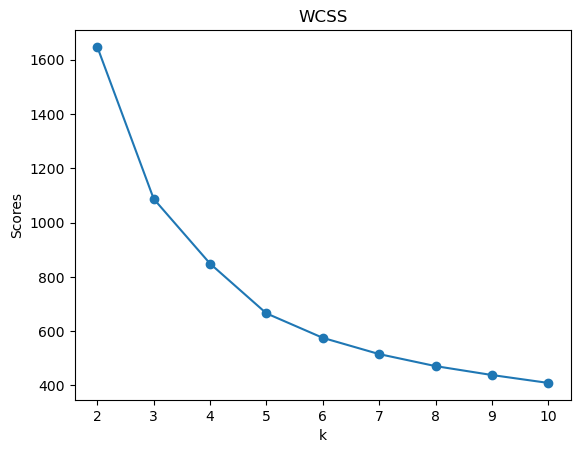

In [67]:
from sklearn.cluster import KMeans
from sklearn import metrics

Num_K = [i+1 for i in range(1, 10)]
WCSS = []

for k in Num_K:
  kmeans = KMeans(n_clusters = k, random_state = 1,)
  model = kmeans.fit(df_Pre)
  WCSS.append(model.inertia_)
print(WCSS)

plt.scatter(Num_K,WCSS )
plt.plot(Num_K,WCSS )
plt.title('WCSS')
plt.ylabel('Scores')
plt.xlabel('k')
plt.show()

จากการหาค่า k หรือ ค่า Optimal cluster number พบว่ามี ค่า Optimal cluster number ที่เหมาะสมที่สุดสำหรับวิธีการ Elbow method จะอยู่ที่ k = 3  

------------------------------------------------------------------------------------------

#### K Mean Clustering Model
หลังจากนั้นทำการสร้าง model โดยเลือกค่า k ที่เท่ากับ 3

In [83]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 3, random_state = 1)
model = kmeans.fit(df_Pre)

from sklearn import metrics
labels = model.labels_
labels

array([1, 1, 2, ..., 0, 1, 2])

- ทำการหาค่า silhouette score ที่เกิดขึ้น พบว่ามีค่าอยู่ที่ประมาณ 0.53

In [84]:
metrics.silhouette_score(df_Pre, labels, metric='euclidean')

0.5374189712887879

- ทำการดูตำแหน่งของจุด centroid ของแต่ละ feature ที่อยู่ในแต่ละ cluster

In [70]:
print(model.cluster_centers_)

[[0.87633862 0.10254429 0.82633307 0.04774913 0.02850846 0.02255025
  0.06182321]
 [0.14459954 0.08043212 0.06239641 0.12262808 0.02889198 0.00603469
  0.08853582]
 [0.89007913 0.79934585 0.47291919 0.06412321 0.06257277 0.0641693
  0.10026906]]


In [71]:
df = pd.DataFrame(model.cluster_centers_,
                  index=pd.Index(['cluster1', 'cluster2', 'cluster3'], name='cluster'),
                  columns=pd.MultiIndex.from_product([['PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'PAYMENTS', 'PURCHASES', 'BALANCE']]))
df.style

,"('PURCHASES_FREQUENCY',)","('ONEOFF_PURCHASES_FREQUENCY',)","('PURCHASES_INSTALLMENTS_FREQUENCY',)","('CASH_ADVANCE_FREQUENCY',)","('PAYMENTS',)","('PURCHASES',)","('BALANCE',)"
cluster,,,,,,,
cluster1,0.876339,0.102544,0.826333,0.047749,0.028508,0.022550,0.061823
cluster2,0.144600,0.080432,0.062396,0.122628,0.028892,0.006035,0.088536
cluster3,0.890079,0.799346,0.472919,0.064123,0.062573,0.064169,0.100269


จากการดูตำแหน่งของจุด Centroid พบว่า
- Cluster 1 : จะมี feature ONEOFF_PURCHASES_FREQUENCY และ PURCHASES_INSTALLMENTS_FREQUENCY ที่มีตำแหน่งที่แตกต่างกับจุด centroid ของ feature อื่น ซึ่งเป็น feature ที่สำคัญในการแบ่ง cluster 1
- Cluster 2 : จะมี feature PURCHASES_FREQUENCY และ PURCHASES_INSTALLMENTS_FREQUENCY ที่มีตำแหน่งที่แตกต่างกับจุด centroid ของ feature อื่นอย่างชัดเจน ซึ่งเป็น feature ที่สำคัญในการแบ่ง cluster 2
- Cluster 3 : จะมี feature PURCHASES_INSTALLMENTS_FREQUENCY, PAYMENTS และ PERCHASES ที่มีตำแหน่งที่แตกต่างกับจุด centroid ของ feature อื่นอย่างชัดเจน ซึ่งเป็น feature ที่สำคัญในการแบ่ง cluster 3

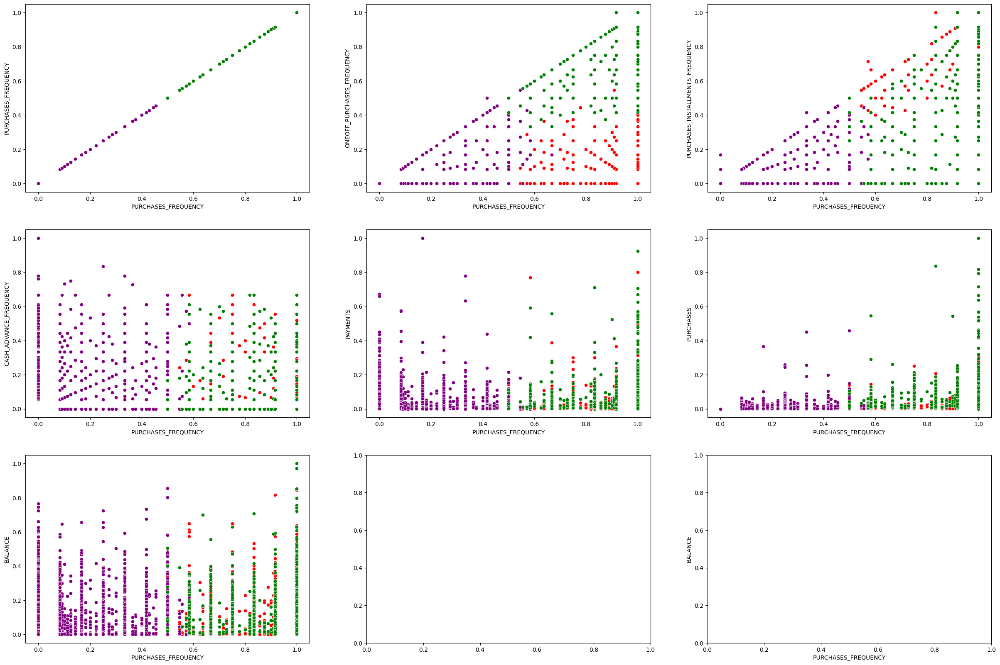

In [72]:
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

label_0 = df_Pre[labels == 0]
label_1 = df_Pre[labels == 1]
label_2 = df_Pre[labels == 2]
cols = df_Pre.columns

fig, ax_arr = plt.subplots(3, 3, figsize=(30, 20))
row = 0
for col in range(0, 7):
    if col % 3 == 0 and col != 0:
        row += 1
    plt.ylabel(cols[col])
    plt.xlabel(cols[0])
    sns.scatterplot(label_0[cols[0]], label_0[cols[col]], color = 'red', ax = ax_arr[row][col%3])
    sns.scatterplot(label_1[cols[0]], label_1[cols[col]], color = 'purple', ax = ax_arr[row][col%3])
    sns.scatterplot(label_2[cols[0]], label_2[cols[col]], color = 'green', ax = ax_arr[row][col%3])
    
plt.show()

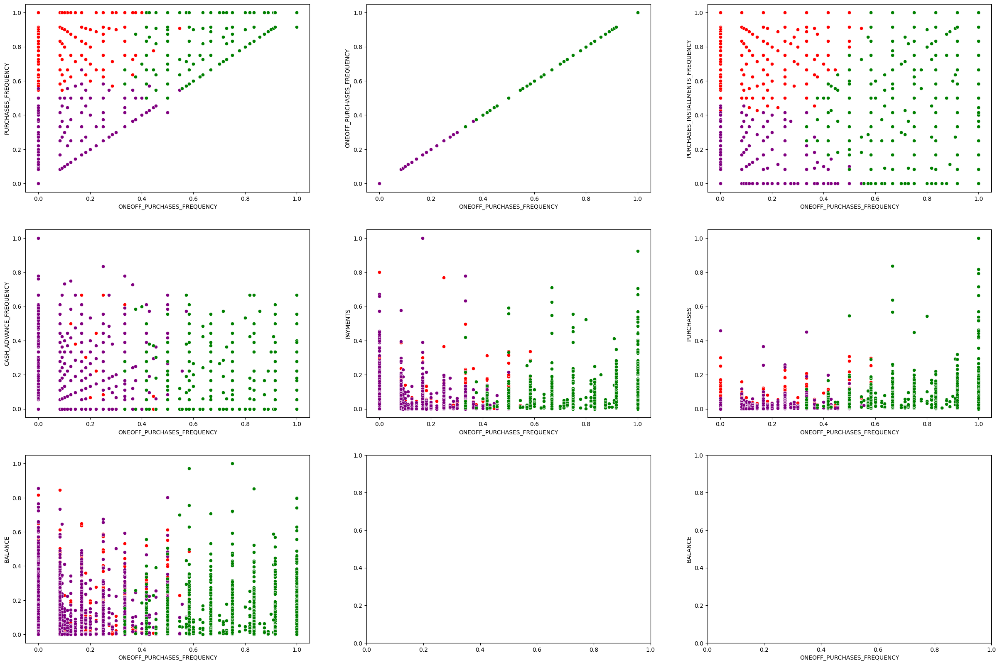

In [73]:
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

label_0 = df_Pre[labels == 0]
label_1 = df_Pre[labels == 1]
label_2 = df_Pre[labels == 2]
cols = df_Pre.columns

fig, ax_arr = plt.subplots(3, 3, figsize=(30, 20))
row = 0
for col in range(0, 7):
    if col % 3 == 0 and col != 0:
        row += 1
    plt.ylabel(cols[col])
    plt.xlabel(cols[1])
    sns.scatterplot(label_0[cols[1]], label_0[cols[col]], color = 'red', ax = ax_arr[row][col%3])
    sns.scatterplot(label_1[cols[1]], label_1[cols[col]], color = 'purple', ax = ax_arr[row][col%3])
    sns.scatterplot(label_2[cols[1]], label_2[cols[col]], color = 'green', ax = ax_arr[row][col%3])
    
plt.show()

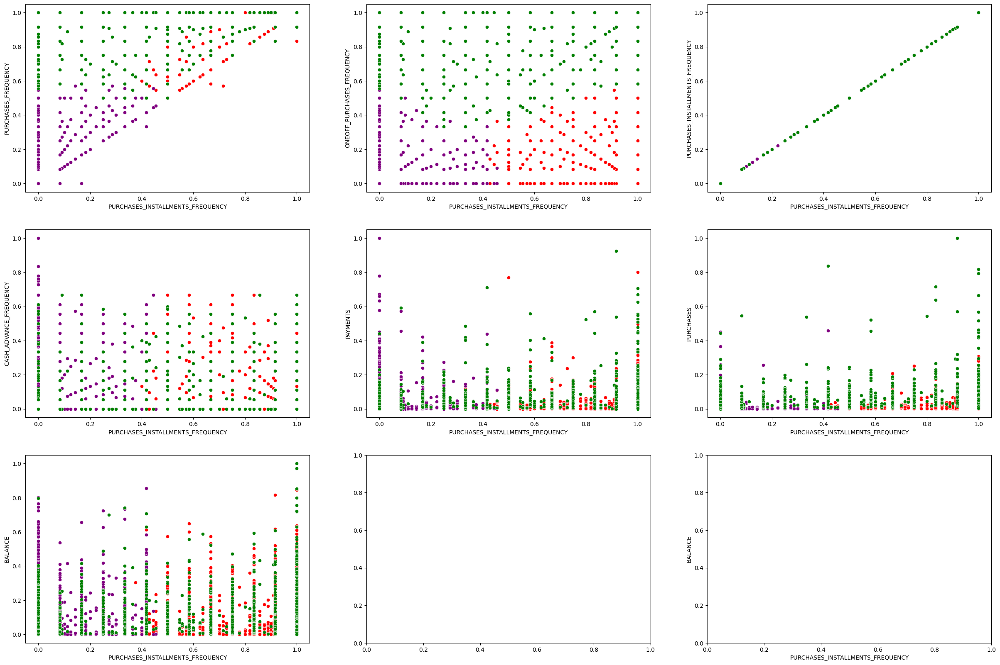

In [74]:
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

label_0 = df_Pre[labels == 0]
label_1 = df_Pre[labels == 1]
label_2 = df_Pre[labels == 2]
cols = df_Pre.columns

fig, ax_arr = plt.subplots(3, 3, figsize=(30, 20))
row = 0
for col in range(0, 7):
    if col % 3 == 0 and col != 0:
        row += 1
    plt.ylabel(cols[col])
    plt.xlabel(cols[2])
    sns.scatterplot(label_0[cols[2]], label_0[cols[col]], color = 'red', ax = ax_arr[row][col%3])
    sns.scatterplot(label_1[cols[2]], label_1[cols[col]], color = 'purple', ax = ax_arr[row][col%3])
    sns.scatterplot(label_2[cols[2]], label_2[cols[col]], color = 'green', ax = ax_arr[row][col%3])
    
plt.show()

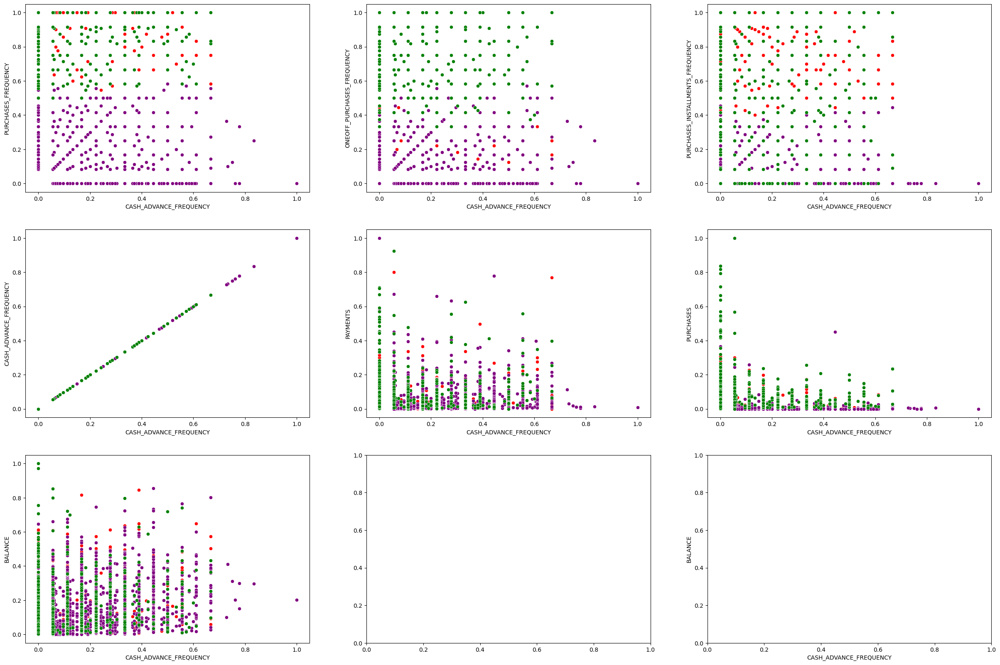

In [77]:
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

label_0 = df_Pre[labels == 0]
label_1 = df_Pre[labels == 1]
label_2 = df_Pre[labels == 2]
cols = df_Pre.columns

fig, ax_arr = plt.subplots(3, 3, figsize=(30, 20))
row = 0
for col in range(0, 7):
    if col % 3 == 0 and col != 0:
        row += 1
    plt.ylabel(cols[col])
    plt.xlabel(cols[3])
    sns.scatterplot(label_0[cols[3]], label_0[cols[col]], color = 'red', ax = ax_arr[row][col%3])
    sns.scatterplot(label_1[cols[3]], label_1[cols[col]], color = 'purple', ax = ax_arr[row][col%3])
    sns.scatterplot(label_2[cols[3]], label_2[cols[col]], color = 'green', ax = ax_arr[row][col%3])
    
plt.show()

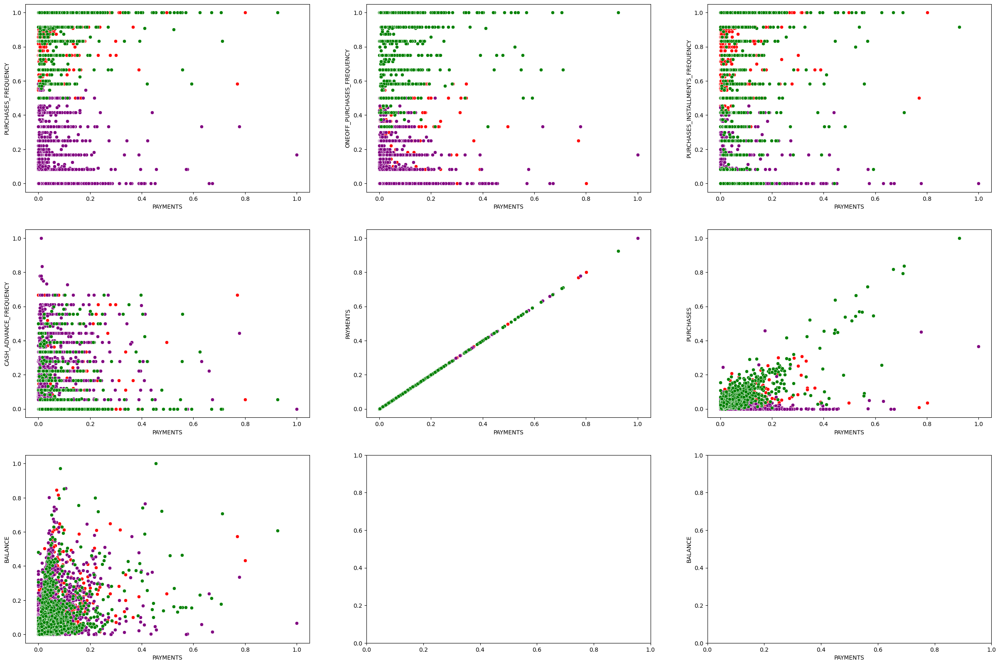

In [78]:
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

label_0 = df_Pre[labels == 0]
label_1 = df_Pre[labels == 1]
label_2 = df_Pre[labels == 2]
cols = df_Pre.columns

fig, ax_arr = plt.subplots(3, 3, figsize=(30, 20))
row = 0
for col in range(0, 7):
    if col % 3 == 0 and col != 0:
        row += 1
    plt.ylabel(cols[col])
    plt.xlabel(cols[4])
    sns.scatterplot(label_0[cols[4]], label_0[cols[col]], color = 'red', ax = ax_arr[row][col%3])
    sns.scatterplot(label_1[cols[4]], label_1[cols[col]], color = 'purple', ax = ax_arr[row][col%3])
    sns.scatterplot(label_2[cols[4]], label_2[cols[col]], color = 'green', ax = ax_arr[row][col%3])
    
plt.show()

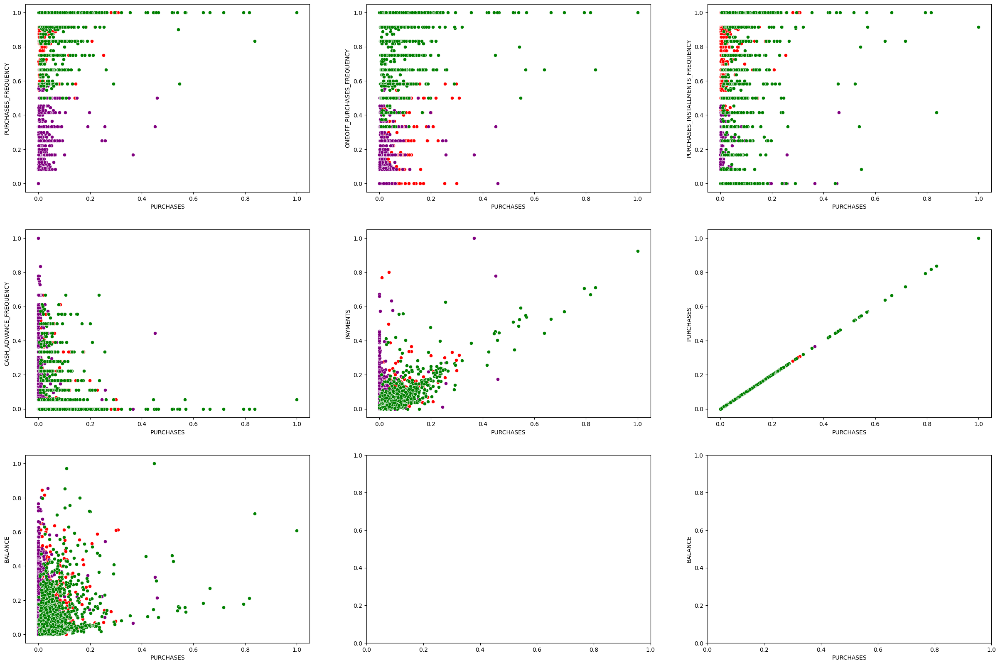

In [79]:
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

label_0 = df_Pre[labels == 0]
label_1 = df_Pre[labels == 1]
label_2 = df_Pre[labels == 2]
cols = df_Pre.columns

fig, ax_arr = plt.subplots(3, 3, figsize=(30, 20))
row = 0
for col in range(0, 7):
    if col % 3 == 0 and col != 0:
        row += 1
    plt.ylabel(cols[col])
    plt.xlabel(cols[5])
    sns.scatterplot(label_0[cols[5]], label_0[cols[col]], color = 'red', ax = ax_arr[row][col%3])
    sns.scatterplot(label_1[cols[5]], label_1[cols[col]], color = 'purple', ax = ax_arr[row][col%3])
    sns.scatterplot(label_2[cols[5]], label_2[cols[col]], color = 'green', ax = ax_arr[row][col%3])
    
plt.show()

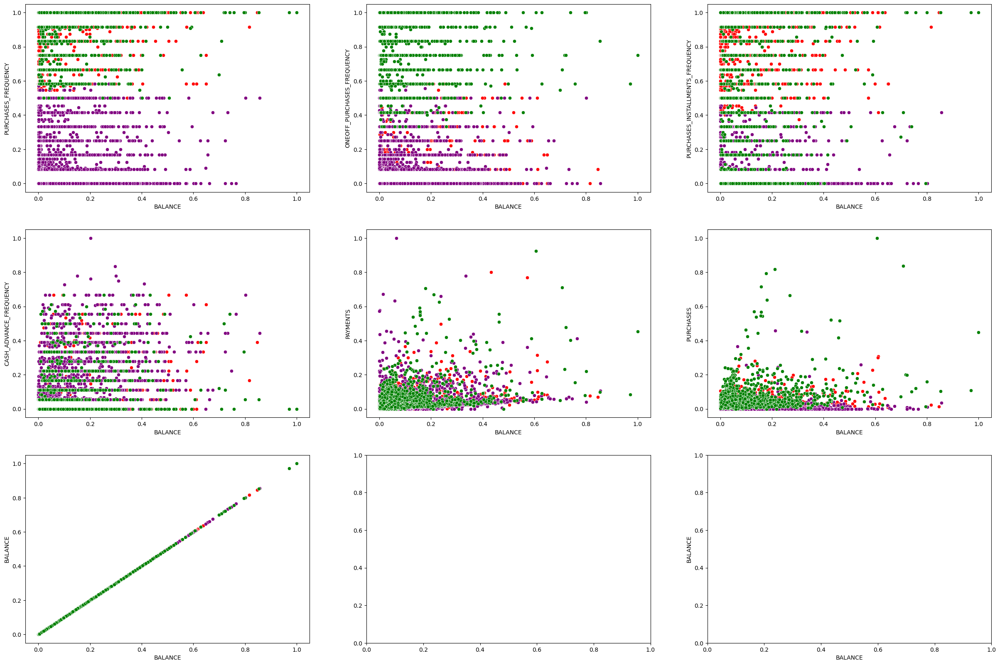

In [80]:
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

label_0 = df_Pre[labels == 0]
label_1 = df_Pre[labels == 1]
label_2 = df_Pre[labels == 2]
cols = df_Pre.columns

fig, ax_arr = plt.subplots(3, 3, figsize=(30, 20))
row = 0
for col in range(0, 7):
    if col % 3 == 0 and col != 0:
        row += 1
    plt.ylabel(cols[col])
    plt.xlabel(cols[6])
    sns.scatterplot(label_0[cols[6]], label_0[cols[col]], color = 'red', ax = ax_arr[row][col%3])
    sns.scatterplot(label_1[cols[6]], label_1[cols[col]], color = 'purple', ax = ax_arr[row][col%3])
    sns.scatterplot(label_2[cols[6]], label_2[cols[col]], color = 'green', ax = ax_arr[row][col%3])
    
plt.show()

# เพิ่ม

Assumtion : จำนวนเงินที่ใช้ ยอดคงเหลือ และความถี่ของในการใช้จ่ายเงินรูปแบบต่าง ๆสามารถแบ่งกลุ่มลูกค้าในเรื่องของการใช้จ่ายเงินที่แตกต่างกันได้ เพื่อนำไปสู่รูปแบบของการโฆษณาประกันที่เหมาะสม 

จากการทำการ plot กราฟเพื่อดูลักษณะการแบ่งกลุ่มของ cluster ทั้งหมด 3 cluster พบว่า การแบ่ง cluster มีลักษณะเป็นไปตามตำแหน่งของจุด centroid ของแต่ละ feature ที่ได้มีการวิเคราะห์ไปก่อนหน้านี้ 
- cluster 0 จะเป็น cluster ที่มี 
    - ONEOFF_PURCHASES_FREQUENCY น้อยกว่า 0.5 
    - PURCHASES_INSTALLMENTS_FREQUENCY มากกว่า 0.5 
    - PURCHASES_FREQUENCY มากกว่า 0.5
    - PURCHASES ปานปลาง
- cluster 1 จะเป็น cluster ที่มี 
    - ONEOFF_PURCHASES_FREQUENCY น้อยกว่า 0.5 
    - PURCHASES_INSTALLMENTS_FREQUENCY น้อยกว่า 0.5
    - PURCHASES_FREQUENCY น้อยกว่า 0.5
    - PURCHASES ต่ำ
- cluster 2 จะเป็น cluster ที่มี 
    - ONEOFF_PURCHASES_FREQUENCY มากกว่า 0.5 
    - PURCHASES_INSTALLMENTS_FREQUENCY น้อยไปจนถึงมาก
    - PURCHASES_FREQUENCY มากกว่า 0.5
    - PURCHASES สูง

ซึ่งจากรูปแบบกราฟของแต่ละ cluster ทีไ่ด้กล่าวมาสามารถวิเคราะห์ถึงลักษณะการใช้จ่ายเงินของแต่ละบุคคลในแต่ละ cluster ได้ว่า 
- cluster 0 เป็นกลุ่มคนที่มีค่าใช้จ่ายปานกลาง แต่มีความถี่ในการใช้จ่ายเงินที่ค่อนข้างมาก และมักจะมีลักษณะของการใช้จ่ายที่เป็นแบบผ่อนมากกว่าการจ่ายแบบทีเดียว 
- cluster 1 เป็นกลุ่มคนที่มีค่าใช้จ่ายน้อย มีความถี่ในการใช้จ่ายเงินที่น้อย และมีลักษณะการใช้จ่ายที่เป็นแบบจ่ายทีเดียวและแบบผ่อนที่มีความใกล้เคียงกัน
- cluster 2 เป็นกลุ่มคนที่มีค่าใช้จ่ายที่สูง แต่มีความถี่ในการใช้จ่ายเงินที่มากและมากกว่ากลุ่มคนใน cluster 1 และมีลักษณะการใช้จ่ายที่เน้นเป็นแบบของการจ่ายทีเดียว ส่วนลักษณะของการจ่ายแบบผ่อนจะขึ้นอยู่กับแต่ละบุคคลโดยจะมีตั้งแต่น้อยไปจนถึงมาก

และจากการวิเคราะห์ถึงลักษณะของ cluster ที่ได้กล่าวมาจะสามารถวิเคราะห์ถึงรูปแบบของประกันที่บริษัทประกันสามารถโฆษณาให้เหมาะสมกับกลุ่มลูกค้า ได้เป็นดังนี้
- สำหรับ cluster 0 เหมาะกับการโฆษณาเกี่ยวกับรูปแบบของประกันที่มีการจ่ายเบี้ยประกันที่มีค่าไม่สูงมากนัก แต่มีการจ่ายเบี้ยประกันเป็นระยะเวลานาน ซึ่งสามารถจ่ายในรูปแบบของการผ่อนจ่ายในแต่ละเดือนได้ โดยรูปแบบของประกัน ดังกล่าวเช่น ประกันแบบสะสมทรัพย์ ประกันแบบตลอดชีพ
- สำหรับ cluster 1 เหมาะกับการโฆษณาเกี่ยวกับรูปแบบของประกันที่มีการจ่ายเบี่ยประกันที่น้อย และสามารถเลือกรูปแบบของการจ่ายเบี้ยประกันได้ โดยรูปแบบของประกัน ดังกล่าวเช่น ประกันแบบชั่วระยะเวลา
- สำหรับ cluster 2 เหมาะกับการโฆษณาเกี่ยวกับรูปแบบของประกันที่มีการจ่ายเบี้ยประกันที่มีค่าที่สูง ซึ่งจะเน้นการจ่ายในรูปแบบของการลงทุนเป็นหลัก โดยรูปแบบของประกัน ดังกล่าวเช่น ประกันควบการลงทุน 